# Exploratory Data Analysis

## Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
pd.set_option("display.max_rows", 15)

In [5]:
athletes_df = pd.read_excel('../data/2021/Athletes.xlsx', engine='openpyxl', sheet_name='Details')
coaches_df = pd.read_excel('../data/2021/Coaches.xlsx', engine='openpyxl', sheet_name='Details')
entries_df = pd.read_excel('../data/2021/EntriesGender.xlsx', engine='openpyxl', sheet_name='Details')
medals_df = pd.read_excel('../data/2021/Medals.xlsx', engine='openpyxl', sheet_name='Details')
teams_df = pd.read_excel('../data/2021/Teams.xlsx', engine='openpyxl', sheet_name='Details')

# 2021 Tokyo Olympics Data

## Athlete Data

In [6]:
athletes_df

,Name,NOC,Discipline
0,AALERUD Katrine,Norway,Cycling Road
1,ABAD Nestor,Spain,Artistic Gymnastics
2,ABAGNALE Giovanni,Italy,Rowing
3,ABALDE Alberto,Spain,Basketball
4,ABALDE Tamara,Spain,Basketball
...,...,...,...
11080,ZWICKER Martin Detlef,Germany,Hockey
11081,ZWOLINSKA Klaudia,Poland,Canoe Slalom
11082,ZYKOVA Yulia,ROC,Shooting
11083,ZYUZINA Ekaterina,ROC,Sailing


In [7]:
noc_df = athletes_df[['NOC', 'Discipline']]

In [8]:
noc_df.shape

(11085, 2)

In [9]:
noc_df['NOC'].nunique()

206

In [10]:
noc_df['Discipline'].nunique()

46

<Axes: xlabel='NOC', ylabel='count'>

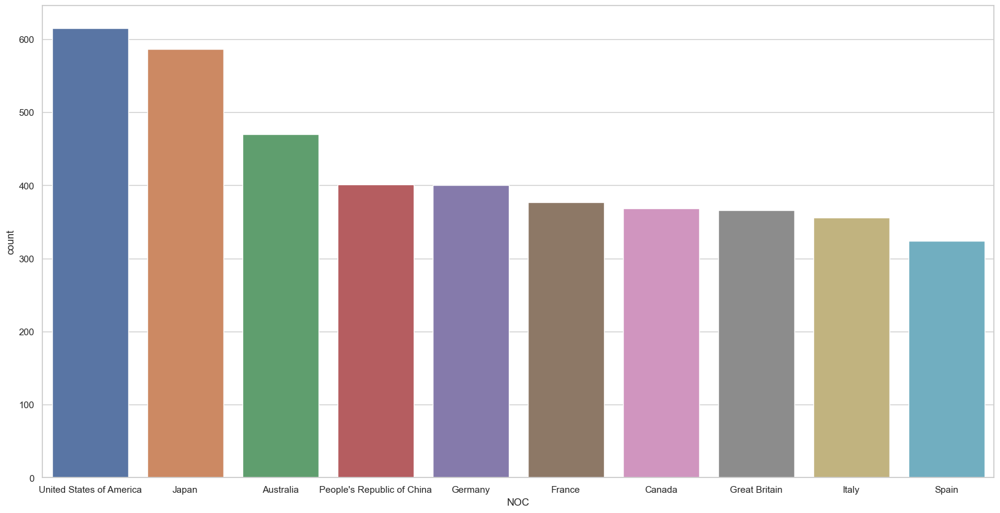

In [11]:
sns.set(style="whitegrid")
plt.figure(figsize=(20, 10))
sns.countplot(x='NOC', data=athletes_df, order=athletes_df['NOC'].value_counts().index[:10])

In [12]:
athletes_df['NOC'].value_counts()

NOC
United States of America       615
Japan                          586
Australia                      470
People's Republic of China     401
Germany                        400
                              ... 
United Republic of Tanzania      2
Saint Kitts and Nevis            2
Marshall Islands                 2
Vanuatu                          2
South Sudan                      2
Name: count, Length: 206, dtype: int64

In [13]:
athletes_df['Discipline'].nunique()

46

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'Athletics'),
  Text(1, 0, 'Swimming'),
  Text(2, 0, 'Football'),
  Text(3, 0, 'Rowing'),
  Text(4, 0, 'Hockey'),
  Text(5, 0, 'Judo'),
  Text(6, 0, 'Handball'),
  Text(7, 0, 'Shooting'),
  Text(8, 0, 'Sailing'),
  Text(9, 0, 'Rugby Sevens'),
  Text(10, 0, 'Basketball'),
  Text(11, 0, 'Wrestling'),
  Text(12, 0, 'Volleyball'),
  Text(13, 0, 'Boxing'),
  Text(14, 0, 'Water Polo'),
  Text(15, 0, 'Fencing'),
  Text(16, 0, 'Equestrian'),
  Text(17, 0, 'Canoe Sprint'),
  Text(18, 0, 'Baseball/Softball'),
  Text(19, 0, 'Cycling Track')])

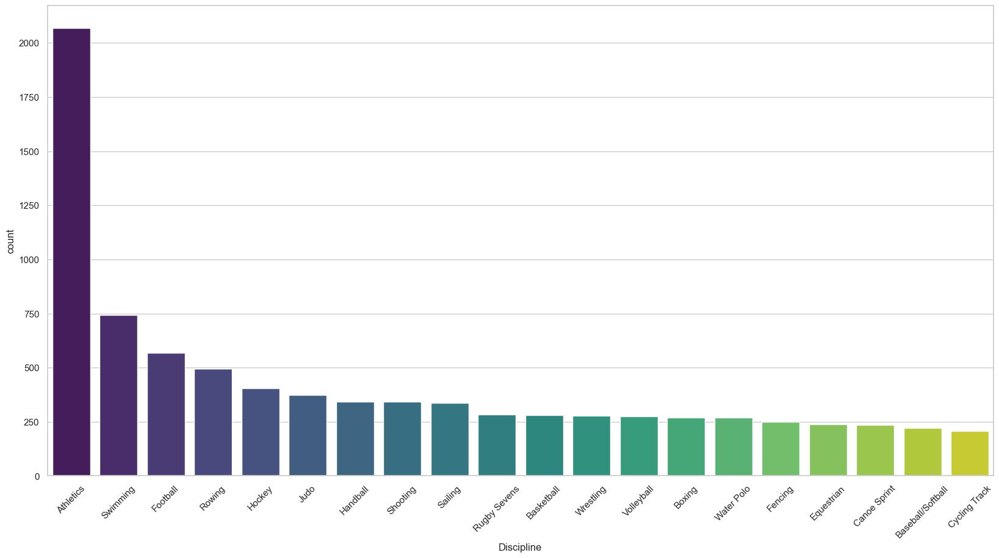

In [14]:
plt.figure(figsize=(20, 10))
sns.countplot(x='Discipline', data=athletes_df, order=athletes_df['Discipline'].value_counts().index[:20], palette='viridis')
plt.xticks(rotation=45)

## Medals

In [15]:
medals_df

,Rank,Team/NOC,Gold,Silver,Bronze,Total,Rank by Total
0,1,United States of America,39,41,33,113,1
1,2,People's Republic of China,38,32,18,88,2
2,3,Japan,27,14,17,58,5
3,4,Great Britain,22,21,22,65,4
4,5,ROC,20,28,23,71,3
...,...,...,...,...,...,...,...
88,86,Ghana,0,0,1,1,77
89,86,Grenada,0,0,1,1,77
90,86,Kuwait,0,0,1,1,77
91,86,Republic of Moldova,0,0,1,1,77


In [16]:
medals_df['Team/NOC'].nunique()

93

## Teams

In [17]:
teams_df

,Name,Discipline,NOC,Event
0,Belgium,3x3 Basketball,Belgium,Men
1,China,3x3 Basketball,People's Republic of China,Men
2,China,3x3 Basketball,People's Republic of China,Women
3,France,3x3 Basketball,France,Women
4,Italy,3x3 Basketball,Italy,Women
...,...,...,...,...
738,South Africa,Water Polo,South Africa,Women
739,Spain,Water Polo,Spain,Men
740,Spain,Water Polo,Spain,Women
741,United States,Water Polo,United States of America,Men


In [18]:
teams_df['Discipline'].nunique()

20

In [19]:
teams_df['NOC'].nunique()

84

In [20]:
filtered_df = teams_df[teams_df['Name'] != teams_df['NOC']]

In [21]:
unique_pairs = filtered_df.drop_duplicates(subset=['Name', 'NOC'])

In [22]:
unique_pairs

,Name,Discipline,NOC,Event
1,China,3x3 Basketball,People's Republic of China,Men
15,United States,3x3 Basketball,United States of America,Women
54,Rep. of Moldova,Archery,Republic of Moldova,Mixed Team
84,Korea,Artistic Gymnastics,Republic of Korea,Men's Team
144,Dominican Rep.,Athletics,Dominican Republic,4 x 400m Relay Mixed
...,...,...,...,...
661,ACHANTA Kamal / BATRA Manika,Table Tennis,India,Mixed Doubles
663,MIZUTANI Jun / ITO Mima,Table Tennis,Japan,Mixed Doubles
668,LEE Sangsu / JEON Jihee,Table Tennis,Republic of Korea,Mixed Doubles
670,IONESCU Ovidiu / SZOCS Bernadette,Table Tennis,Romania,Mixed Doubles


In [23]:
teams_df['Name'].value_counts()

Name
Japan                45
United States        43
Italy                34
Germany              32
France               32
                     ..
Ludwig/Kozuch         1
Thole J./Wickler      1
Perusic/Schweiner     1
Lidy/Leila            1
Venezuela             1
Name: count, Length: 146, dtype: int64

In [24]:
teams_df['NOC'].nunique()

84

In [25]:
teams_df['Event'].value_counts()

Event
Men                     120
Women                   114
Men's Team               40
Women's Team             40
Mixed Team               29
                       ... 
Men's Team Sprint         8
Men's Team Pursuit        8
Women's Team Pursuit      8
Baseball                  6
Softball                  6
Name: count, Length: 36, dtype: int64

In [26]:
teams_df['Discipline'].nunique()

20

## Entries Gender

In [27]:
entries_df

,Discipline,Female,Male,Total
0,3x3 Basketball,32,32,64
1,Archery,64,64,128
2,Artistic Gymnastics,98,98,196
3,Artistic Swimming,105,0,105
4,Athletics,969,1072,2041
...,...,...,...,...
41,Triathlon,55,55,110
42,Volleyball,144,144,288
43,Water Polo,122,146,268
44,Weightlifting,98,99,197


In [28]:
entries_df['Discipline'].nunique()

46

## Coaches

In [29]:
coaches_df

,Name,NOC,Discipline,Event
0,ABDELMAGID Wael,Egypt,Football,NaN
1,ABE Junya,Japan,Volleyball,NaN
2,ABE Katsuhiko,Japan,Basketball,NaN
3,ADAMA Cherif,Côte d'Ivoire,Football,NaN
4,AGEBA Yuya,Japan,Volleyball,NaN
...,...,...,...,...
389,ZAMORA PEDREIRA Javier,Spain,Basketball,NaN
390,ZAMPIERI Francesca,Liechtenstein,Artistic Swimming,Duet
391,ZHANG Xiaohuan,People's Republic of China,Artistic Swimming,NaN
392,ZIJP Simon,Netherlands,Hockey,NaN


# All Olympic Data

In [30]:
athlete_events = pd.read_csv('../data/all_data/athlete_events.csv')

In [31]:
athlete_events.shape

(271116, 15)

In [32]:
athlete_events.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [33]:
athlete_events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [34]:
athlete_events['NOC'].nunique()

230

In [35]:
athlete_events.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.338970,70.702393,1978.378480
std,39022.286345,6.393561,10.518462,14.348020,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


## Cleaning Data

In [36]:
athlete_events.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [37]:
athlete_events['Medal'] = athlete_events['Medal'].fillna('None')

In [38]:
athlete_events.isnull().sum()

ID            0
Name          0
Sex           0
Age        9474
Height    60171
Weight    62875
Team          0
NOC           0
Games         0
Year          0
Season        0
City          0
Sport         0
Event         0
Medal         0
dtype: int64

## Data after 1960

In [39]:
recent_data = athlete_events[athlete_events['Year'] >= 1960]
# recent_data = athlete_events

In [40]:
recent_data.describe()

,ID,Age,Height,Weight,Year
count,209072.000000,207957.000000,197953.000000,197248.000000,209072.000000
mean,68378.778516,24.966863,175.355145,70.667959,1991.858680
std,39048.083180,5.485369,10.624469,14.446638,16.574837
min,1.000000,11.000000,127.000000,25.000000,1960.000000
25%,34887.000000,21.000000,168.000000,60.000000,1980.000000
50%,68360.000000,24.000000,175.000000,70.000000,1994.000000
75%,102096.000000,28.000000,183.000000,79.000000,2006.000000
max,135571.000000,71.000000,226.000000,214.000000,2016.000000


In [41]:
recent_data['Year'].value_counts()

Year
1992    16413
1988    14676
2000    13821
1996    13780
2016    13688
        ...  
2010     4402
2006     4382
2002     4109
1998     3605
1994     3160
Name: count, Length: 21, dtype: int64

In [42]:
recent_data['Sport'].nunique()

51

In [43]:
recent_data.isnull().sum()

ID            0
Name          0
Sex           0
Age        1115
Height    11119
Weight    11824
Team          0
NOC           0
Games         0
Year          0
Season        0
City          0
Sport         0
Event         0
Medal         0
dtype: int64

In [44]:
missing_values_by_year = recent_data.groupby('Year').apply(lambda x: x.isnull().sum())
missing_values_by_year

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
Year,,,,,,,,,,,,,,,
1960,0,0,0,221,961,1048,0,0,0,0,0,0,0,0,0
1964,0,0,0,56,681,708,0,0,0,0,0,0,0,0,0
1968,0,0,0,118,153,169,0,0,0,0,0,0,0,0,0
1972,0,0,0,96,301,389,0,0,0,0,0,0,0,0,0
1976,0,0,0,52,876,920,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008,0,0,0,2,151,159,0,0,0,0,0,0,0,0,0
2010,0,0,0,0,2,24,0,0,0,0,0,0,0,0,0
2012,0,0,0,0,168,360,0,0,0,0,0,0,0,0,0


In [45]:
recent_data = recent_data.dropna()

In [46]:
# Define function to identify outliers
def check_for_outliers(df, column):
    Q1 = np.percentile(df[column], 25)
    Q3 = np.percentile(df[column], 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 4.5 * IQR
    upper_bound = Q3 + 4.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

In [47]:
weight_outliers = check_for_outliers(recent_data, 'Weight')
weight_outliers

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
23155,12177,"Ricardo Blas, Jr.",M,21.0,183.0,214.0,Guam,GUM,2008 Summer,2008,Summer,Beijing,Judo,Judo Men's Heavyweight,None
23156,12177,"Ricardo Blas, Jr.",M,25.0,183.0,214.0,Guam,GUM,2012 Summer,2012,Summer,London,Judo,Judo Men's Heavyweight,None
39181,20144,Andrey Ivanovich Chemerkin,M,24.0,183.0,170.0,Russia,RUS,1996 Summer,1996,Summer,Atlanta,Weightlifting,Weightlifting Men's Super-Heavyweight,Gold
39182,20144,Andrey Ivanovich Chemerkin,M,28.0,183.0,170.0,Russia,RUS,2000 Summer,2000,Summer,Sydney,Weightlifting,Weightlifting Men's Super-Heavyweight,Bronze
63391,32496,Ion Emilianov,M,23.0,202.0,165.0,Moldova,MDA,2000 Summer,2000,Summer,Sydney,Athletics,Athletics Men's Shot Put,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237039,118869,"Christopher J. ""Chris"" Taylor",M,22.0,196.0,182.0,United States,USA,1972 Summer,1972,Summer,Munich,Wrestling,"Wrestling Men's Super-Heavyweight, Greco-Roman",None
237040,118869,"Christopher J. ""Chris"" Taylor",M,22.0,196.0,182.0,United States,USA,1972 Summer,1972,Summer,Munich,Wrestling,"Wrestling Men's Super-Heavyweight, Freestyle",Bronze
262338,131260,Janusz Wojnarowicz,M,28.0,199.0,170.0,Poland,POL,2008 Summer,2008,Summer,Beijing,Judo,Judo Men's Heavyweight,None
262339,131260,Janusz Wojnarowicz,M,32.0,199.0,170.0,Poland,POL,2012 Summer,2012,Summer,London,Judo,Judo Men's Heavyweight,None


- not outliers since its in the Judo Men's Heavyweight and middleweight category

In [48]:
height_outliers = check_for_outliers(recent_data, 'Height')
height_outliers

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal


- no outliers for height 

In [49]:
age_outliers = check_for_outliers(recent_data, 'Age')
age_outliers

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
6793,3814,Edward Allan Anderson,M,60.0,166.0,63.0,Belize,BIZ,1968 Summer,1968,Summer,Mexico City,Shooting,"Shooting Mixed Small-Bore Rifle, Prone, 50 metres",None
9788,5360,Jos Antonio Artecona Artze,M,63.0,175.0,87.0,Puerto Rico,PUR,1996 Summer,1996,Summer,Atlanta,Shooting,Shooting Men's Trap,None
9789,5360,Jos Antonio Artecona Artze,M,63.0,175.0,87.0,Puerto Rico,PUR,1996 Summer,1996,Summer,Atlanta,Shooting,Shooting Men's Double Trap,None
29760,15360,Harold Brooke,M,61.0,182.0,87.0,Gabbiano,AUS,1960 Summer,1960,Summer,Roma,Sailing,Sailing Mixed Three Person Keelboat,None
29912,15436,Julie Brougham,F,62.0,157.0,48.0,New Zealand,NZL,2016 Summer,2016,Summer,Rio de Janeiro,Equestrianism,"Equestrianism Mixed Dressage, Individual",None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240863,120661,Mark James Todd,M,60.0,190.0,78.0,New Zealand,NZL,2016 Summer,2016,Summer,Rio de Janeiro,Equestrianism,"Equestrianism Mixed Three-Day Event, Team",None
241317,120874,Joan Tomas Roca,M,61.0,177.0,87.0,Andorra,AND,2012 Summer,2012,Summer,London,Shooting,Shooting Men's Trap,None
259606,129963,John Edwin Whitaker,M,60.0,171.0,70.0,Great Britain,GBR,2016 Summer,2016,Summer,Rio de Janeiro,Equestrianism,"Equestrianism Mixed Jumping, Individual",None
259607,129963,John Edwin Whitaker,M,60.0,171.0,70.0,Great Britain,GBR,2016 Summer,2016,Summer,Rio de Janeiro,Equestrianism,"Equestrianism Mixed Jumping, Team",None


- Age is higher in sports like Shooting, Equestrianism Jumping as these are more skill based sports rather than physical sports.

In [50]:
# Calculate BMI
recent_data['BMI'] = recent_data['Weight'] / ((recent_data['Height'] / 100) ** 2)

In [51]:
recent_data.to_csv('../data/all_data/cleaned_recent_data.csv', index=False)

## Visualizations

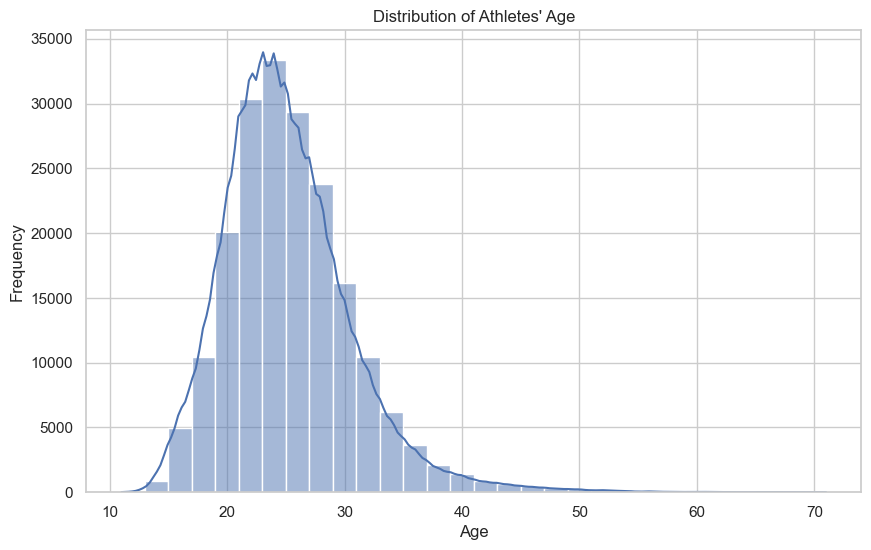

In [52]:
# Distribution of Age
plt.figure(figsize=(10, 6))
sns.histplot(recent_data['Age'], bins=30, kde=True)
plt.title('Distribution of Athletes\' Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

In [53]:
df = px.data.tips()
fig = px.histogram(recent_data, x="Age", nbins=30, opacity=0.8) 

fig.update_layout(
    title_text='Distribution of Athletes\' Age', 
    xaxis_title_text='Age', # xaxis label
    yaxis_title_text='Number of Athletes', # yaxis label
    bargap=0.02, # gap between bars of adjacent location coordinates
    bargroupgap=0.01 # gap between bars of the same location coordinates
)

fig.show()

In [54]:
df = px.data.tips()
fig = px.histogram(recent_data, x="Age", nbins=30, opacity=0.8, color='Sex') 

fig.update_layout(
    title_text='Distribution of Athletes\' Age by Sex', 
    xaxis_title_text='Age', # xaxis label
    yaxis_title_text='Number of Athletes', # yaxis label
    bargap=0.02, # gap between bars of adjacent location coordinates
    bargroupgap=0.01 # gap between bars of the same location coordinates
)

fig.show()

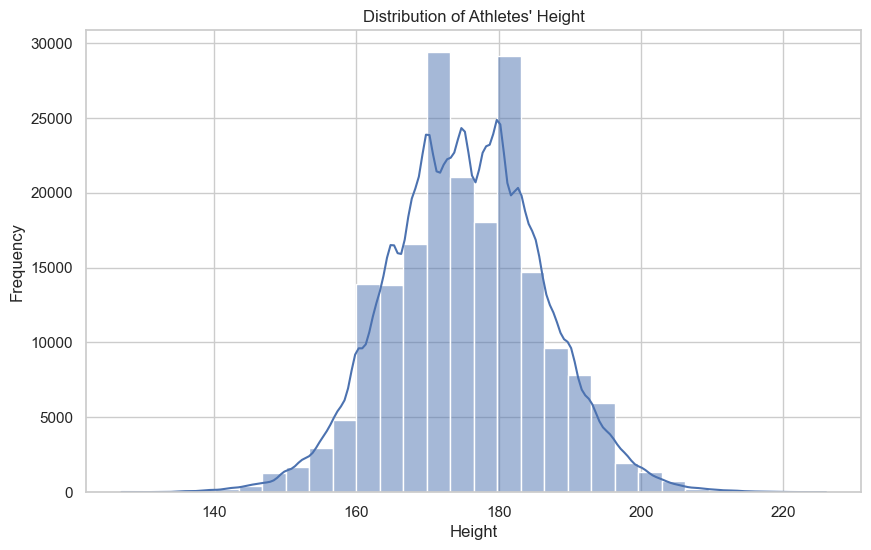

In [55]:
# Distribution of Height
plt.figure(figsize=(10, 6))
sns.histplot(recent_data['Height'], bins=30, kde=True)
plt.title('Distribution of Athletes\' Height')
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.show()

In [56]:
df = px.data.tips()
fig = px.histogram(recent_data, x="Height", nbins=30, title='Distribution of Athletes\' Height', opacity=0.8, color='Sex') 

fig.update_layout(
    title_text='Distribution of Athletes\' Height by Sex', 
    xaxis_title_text='Height', # xaxis label
    yaxis_title_text='Number of Athletes', # yaxis label
    bargap=0.02, # gap between bars of adjacent location coordinates
    bargroupgap=0.01 # gap between bars of the same location coordinates
)
fig.show()

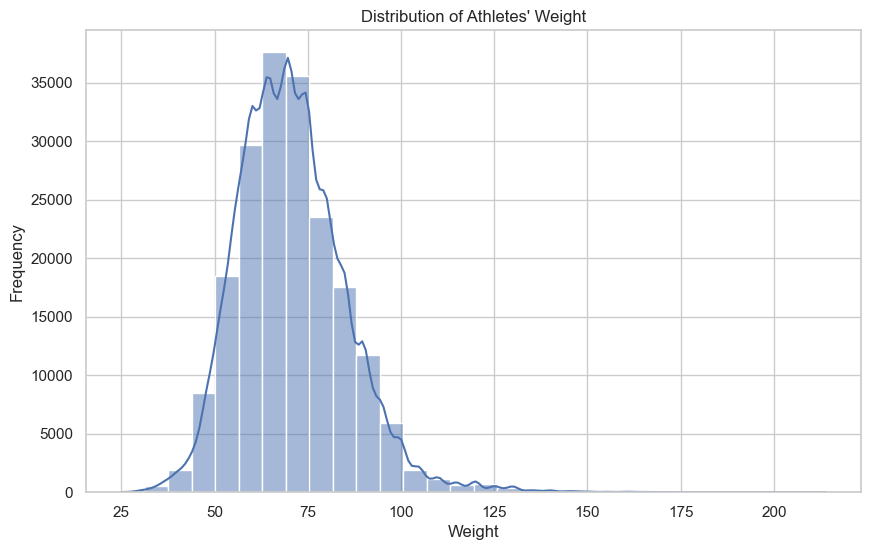

In [57]:
# Distribution of Weight
plt.figure(figsize=(10, 6))
sns.histplot(recent_data['Weight'], bins=30, kde=True)
plt.title('Distribution of Athletes\' Weight')
plt.xlabel('Weight')
plt.ylabel('Frequency')
plt.show()

In [58]:
df = px.data.tips()
fig = px.histogram(recent_data, x="Weight", nbins=30, title='Distribution of Athletes\' Weight', opacity=0.8, color='Sex') 

fig.update_layout(
    title_text='Distribution of Athletes\' Weight by Sex', 
    xaxis_title_text='Weight', # xaxis label
    yaxis_title_text='Number of Athletes', # yaxis label
    bargap=0.02, # gap between bars of adjacent location coordinates
    bargroupgap=0.01 # gap between bars of the same location coordinates
)
fig.show()

In [59]:
df = px.data.tips()
fig = px.histogram(recent_data, x="BMI", nbins=30, opacity=0.8, color='Sex') 

fig.update_layout(
    title_text='Distribution of Athletes\' BMI by Sex', 
    xaxis_title_text='BMI', # xaxis label
    yaxis_title_text='Number of Athletes', # yaxis label
    bargap=0.02, # gap between bars of adjacent location coordinates
    bargroupgap=0.01 # gap between bars of the same location coordinates
)

fig.show()

In [60]:
# Calculate counts by sport
sport_counts = recent_data['Sport'].value_counts().reset_index()
sport_counts.columns = ['Sport', 'Count']

# Select top 10 sports by count
top_15_sports = sport_counts.head(15)['Sport']

# Filter the original data to include only the top 10 sports
top_15_data = recent_data[recent_data['Sport'].isin(top_15_sports)]

# Create the histogram for the top 10 sports
fig = px.histogram(top_15_data, x="Sport", color="Sex", barmode='group', title="Top 15 Sports Distribution by Sex")
fig.update_layout(xaxis={'categoryorder':'total descending'}, height=600)
fig.show()

In [61]:
sport_sex_distribution = recent_data.groupby(['Sport', 'Sex']).size().reset_index(name='Count')

In [62]:
# Create a stacked bar plot
fig = px.bar(sport_sex_distribution, x="Sport", y="Count", color="Sex", 
             title="Participants by Sex for Each Sport",
             labels={'Count': 'Number of Participants'},
             barmode='stack')

fig.update_layout(xaxis={'categoryorder':'total descending'}, height=600)
fig.show()


In [63]:
recent_data['Medal'].value_counts()

Medal
None      168346
Bronze      9441
Gold        9190
Silver      9107
Name: count, dtype: int64

In [64]:
medal_data = recent_data[recent_data['Medal'] != 'None']
medal_counts = medal_data.groupby('NOC')['Medal'].count().reset_index()
medal_counts.columns = ['Country', 'Medal_Count']

fig = px.choropleth(medal_counts, locations='Country', locationmode='ISO-3', color='Medal_Count',
                    title="Medal Distribution by Country",
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

In [66]:
countries_data = medal_data[medal_data['NOC'].isin(medal_counts['Country'])]

# Aggregate the data for the stacked bar chart
medal_agg = countries_data.groupby(['NOC', 'Medal']).size().reset_index(name='Count')

# Create the stacked bar chart
fig2 = px.bar(medal_agg, x='NOC', y='Count', color='Medal', title="Medals Distribution by Country",
              category_orders={'Medal': ['Gold', 'Silver', 'Bronze']},
              color_discrete_map={'Gold': '#FFD700', 'Silver': '#C0C0C0', 'Bronze': '#CD7F32'})

# Update layout for better visualization
fig2.update_layout(
    barmode='stack',
    plot_bgcolor='rgba(0, 0, 0, 0)',  # Transparent background
    xaxis=dict(
        linecolor='black',
        showgrid=False,
        showline=True
    ),
    yaxis=dict(
        linecolor='black',
        showgrid=False,
        showline=True
    ),
    title_font=dict(size=24, color='black'),
    xaxis_title_font=dict(size=18, color='black'),
    yaxis_title_font=dict(size=18, color='black'),
    legend_title_font=dict(size=16, color='black')
)

fig2.show()


## Hypothesis Testing 

- likely age to win (age affect on chances at winning, are older ppl taking L)
- country prior wins -> win more
- hosting country gets advantage
- num of participants vs medals
- gdp per capita vs medals
- youth population vs medals
- age of coaches vs medals

#### 1. Age Affect on Chances at Winning

In [68]:
from scipy.stats import ttest_ind

winners = recent_data[recent_data['Medal'] != 'None']['Age']
non_winners = recent_data[recent_data['Medal'] == 'None']['Age']

# Perform t-test
t_stat, p_value = ttest_ind(winners, non_winners)

print(f"T-statistic: {t_stat}, P-value: {p_value}")

T-statistic: 13.537198113225916, P-value: 9.848772546414331e-42


In [75]:
from scipy.stats import pearsonr

# Assuming recent_data is your DataFrame containing recent Olympic data

# Group data by NOC to get the number of participants and medals
participants = recent_data.groupby('NOC')['ID'].count()
medals = recent_data[recent_data['Medal'] != 'None'].groupby('NOC')['ID'].count()

# Align both Series by their indices (NOC)
aligned_data = pd.DataFrame({'Participants': participants, 'Medals': medals}).fillna(0)

# Perform Pearson correlation test
correlation, p_value = pearsonr(aligned_data['Participants'], aligned_data['Medals'])

print(f"Correlation: {correlation}, P-value: {p_value}")


Correlation: 0.8855452323658638, P-value: 1.5715772525444206e-75


## NOC Regions

In [125]:
noc_regions = pd.read_csv('../data/all_data/noc_regions.csv')

In [126]:
noc_regions

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN
...,...,...,...
225,YEM,Yemen,NaN
226,YMD,Yemen,South Yemen
227,YUG,Serbia,Yugoslavia
228,ZAM,Zambia,NaN
